# FL MAP

In [1]:
import pandas as pd
import numpy as np

In [2]:
df_fl = pd.read_csv("../00_source_data/listings_florida.csv.gz")
df_fl.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,57818,https://www.airbnb.com/rooms/57818,20211223224458,2021-12-24,Private house close to the beach!,Beautifully private duplex that allows you to ...,Check-in window<br />After 3:00 PM<br />Edit<b...,https://a0.muscache.com/pictures/347696/9d5168...,275948,https://www.airbnb.com/users/show/275948,...,4.96,4.88,4.70,NaN,f,1,1,0,0,0.51
1,69824,https://www.airbnb.com/rooms/69824,20211223224458,2021-12-24,2 bd/2ba Oceanfront Condo,<b>The space</b><br />Beautiful and meticulous...,NaN,https://a0.muscache.com/pictures/443102/f6b94e...,351303,https://www.airbnb.com/users/show/351303,...,4.00,5.00,4.00,NaN,f,2,2,0,0,0.04
2,83449,https://www.airbnb.com/rooms/83449,20211223224458,2021-12-24,MARY POP APTS 2/1 APT SLEEP 5,MARY POP APARTMENTS 1&2 BEDROOM SUITES ACCOMMO...,NaN,https://a0.muscache.com/pictures/13dd4c7e-4914...,454736,https://www.airbnb.com/users/show/454736,...,4.89,4.79,4.89,NaN,f,8,8,0,0,0.16
3,105411,https://www.airbnb.com/rooms/105411,20211223224458,2021-12-24,House in the Ranches,Close to Cleveland Clinic Hospital and mayor h...,"Very close to I75, one of the main highways. Y...",https://a0.muscache.com/pictures/787317/2cc18e...,532930,https://www.airbnb.com/users/show/532930,...,5.00,4.25,5.00,NaN,f,1,1,0,0,0.04
4,129061,https://www.airbnb.com/rooms/129061,20211223224458,2021-12-24,MIAMI - LUXURY APARTMENT OVER BEACH,<b>The space</b><br />The apartment is located...,NaN,https://a0.muscache.com/pictures/828456/8efef9...,637272,https://www.airbnb.com/users/show/637272,...,5.00,4.61,4.50,NaN,f,6,6,0,0,0.14


In [3]:
df_fl.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [4]:
df_fl_s = df_fl[['host_is_superhost', 'latitude', 'longitude']]

In [5]:
df_fl_s.head()

,host_is_superhost,latitude,longitude
0,f,26.01670,-80.12437
1,f,25.97641,-80.12052
2,f,26.03392,-80.14201
3,f,26.04678,-80.36809
4,f,25.99332,-80.11887


In [6]:
sum(df_fl_s.host_is_superhost != 'f')

3594

In [7]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon

%matplotlib inline
%config InlineBackend.figure_format = 'retina' # Optional - best for macs
plt.rcParams.update({'font.size': 14})
plt.rcParams['figure.figsize'] = (20, 10)

In [8]:
crs = {'init': 'epsg:4326'}

In [9]:
geometry = [Point(xy) for xy in zip(df_fl_s['longitude'], df_fl_s['latitude'])]
geometry[:3]

In [10]:
geo_df = gpd.GeoDataFrame(df_fl_s, 
                         crs = crs, 
                         geometry=geometry)
geo_df.head()

/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,host_is_superhost,latitude,longitude,geometry
0,f,26.01670,-80.12437,POINT (-80.12437 26.01670)
1,f,25.97641,-80.12052,POINT (-80.12052 25.97641)
2,f,26.03392,-80.14201,POINT (-80.14201 26.03392)
3,f,26.04678,-80.36809,POINT (-80.36809 26.04678)
4,f,25.99332,-80.11887,POINT (-80.11887 25.99332)


In [11]:
# fl_county_map = gpd.read_file('./cities/Cities.shp')
# fl_county_map = gpd.read_file('./urbanboundary/BoundaryUrban.shp')
# fl_county_map = gpd.read_file('./tl_2021_us_county/tl_2021_us_county.shp')

# fig, ax = plt.subplots(figsize = (15, 15))
# fl_county_map.plot(ax=ax)

## Solution 1

Precise mapping using geodata for county boundary here: https://public.opendatasoft.com/explore/dataset/us-county-boundaries/information/?disjunctive.statefp&disjunctive.countyfp&disjunctive.name&disjunctive.namelsad&disjunctive.stusab&disjunctive.state_name

However, the bounary seems to include the sea line. 

Further, the result doesn't look nice for report

In [12]:
# la_county_map2 = gpd.read_file('./ca_58/us-county-boundaries/us-county-boundaries.shp')
fl_county_map2 = gpd.read_file('./../../filesMapFLCA/fl_1/us-county-boundaries/us-county-boundaries.shp')

<AxesSubplot:>

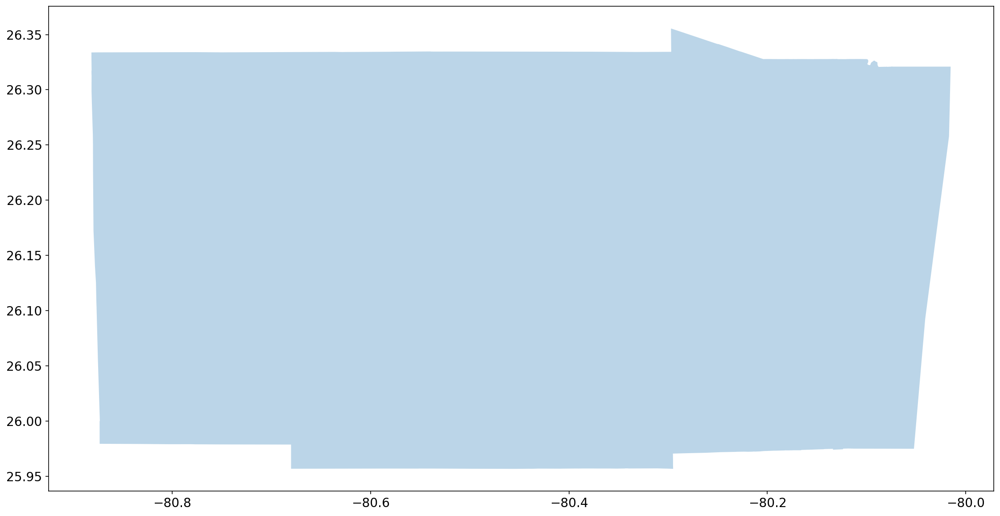

In [13]:
fig, ax = plt.subplots()
fl_county_map2.plot(ax=ax, alpha = 0.3)

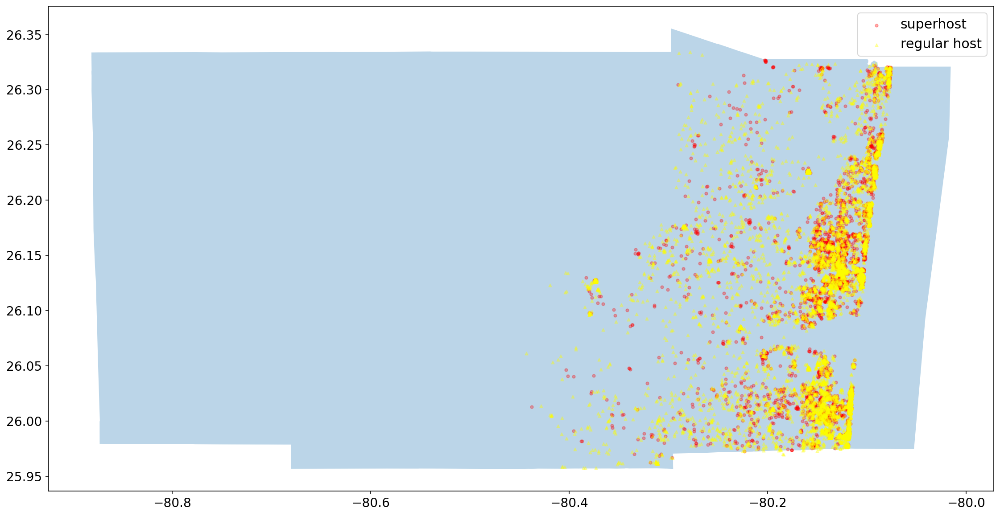

In [35]:
fig, ax = plt.subplots(figsize = (20,10))

# try
# fl_county_map.plot(ax = ax)
# ax.imshow(la, zorder=0, 
#           extent = BBox, 
#           aspect= 'equal')

# try
fl_county_map2.plot(ax=ax, alpha = 0.3)

# try
# gdf_la.plot(ax = ax, alpha = 0.3) 

geo_df[geo_df['host_is_superhost'] != 'f'].plot(ax = ax,
                                                alpha = 0.3,
                                                markersize = 10, 
                                                color = 'red',
                                                marker = 'o', 
                                                label = 'superhost')
geo_df[geo_df['host_is_superhost'] == 'f'].plot(ax = ax, 
                                                alpha = 0.3,
                                                markersize = 10, 
                                                color = 'yellow',
                                                marker = '^', 
                                                label = 'regular host')

plt.legend(prop={'size': 15})

## Solution 2

Tweaked method on adjusting the background image's ratio with BBox.

Better looking, but inprecision location.

In [15]:
fl = plt.imread("./../../filesMapFLCA/flmap.png")

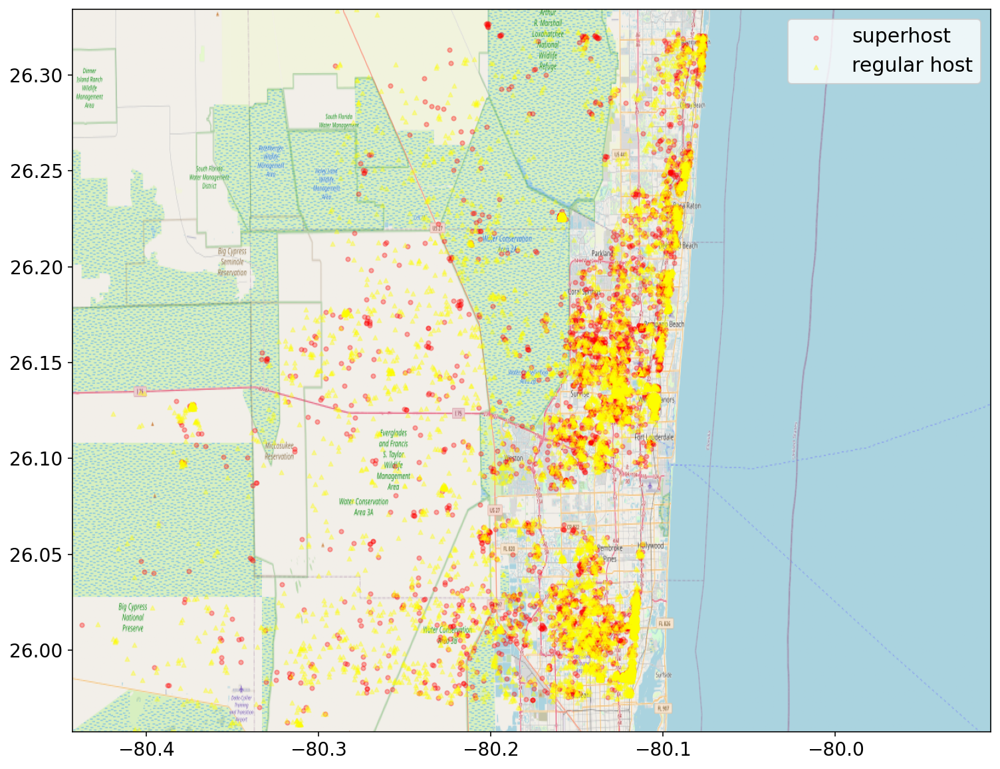

In [36]:
BBox = (df_fl_s.longitude.min(),   
        df_fl_s.longitude.min()+(df_fl_s.longitude.max() - df_fl_s.longitude.min())/0.69,      
        df_fl_s.latitude.min(), 
        df_fl_s.latitude.max())

# print(BBox)

fig, ax = plt.subplots(figsize = (20,10))
# fl_county_map.plot(ax = ax)
ax.imshow(fl, zorder=0, 
          extent = BBox, 
          aspect= 'equal')
geo_df[geo_df['host_is_superhost'] != 'f'].plot(ax = ax,
                                                alpha = 0.3,
                                                markersize = 10, 
                                                color = 'red',
                                                marker = 'o', 
                                                label = 'superhost')
geo_df[geo_df['host_is_superhost'] == 'f'].plot(ax = ax, 
                                                alpha = 0.3,
                                                markersize = 10, 
                                                color = 'yellow',
                                                marker = '^', 
                                                label = 'regular host')
plt.legend(prop={'size': 15})

## Solution 3

A lot tweaked method by adjusting both BBox and background picture.

Best looking for report and presentation. Inprecise location.

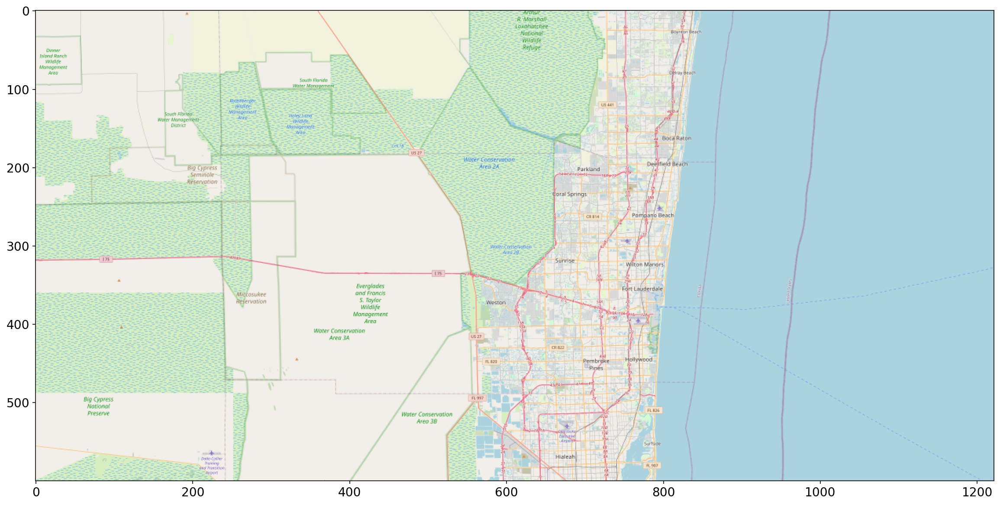

In [17]:
fig, ax = plt.subplots(figsize = (20, 10))
ax.imshow(fl)

<AxesSubplot:>

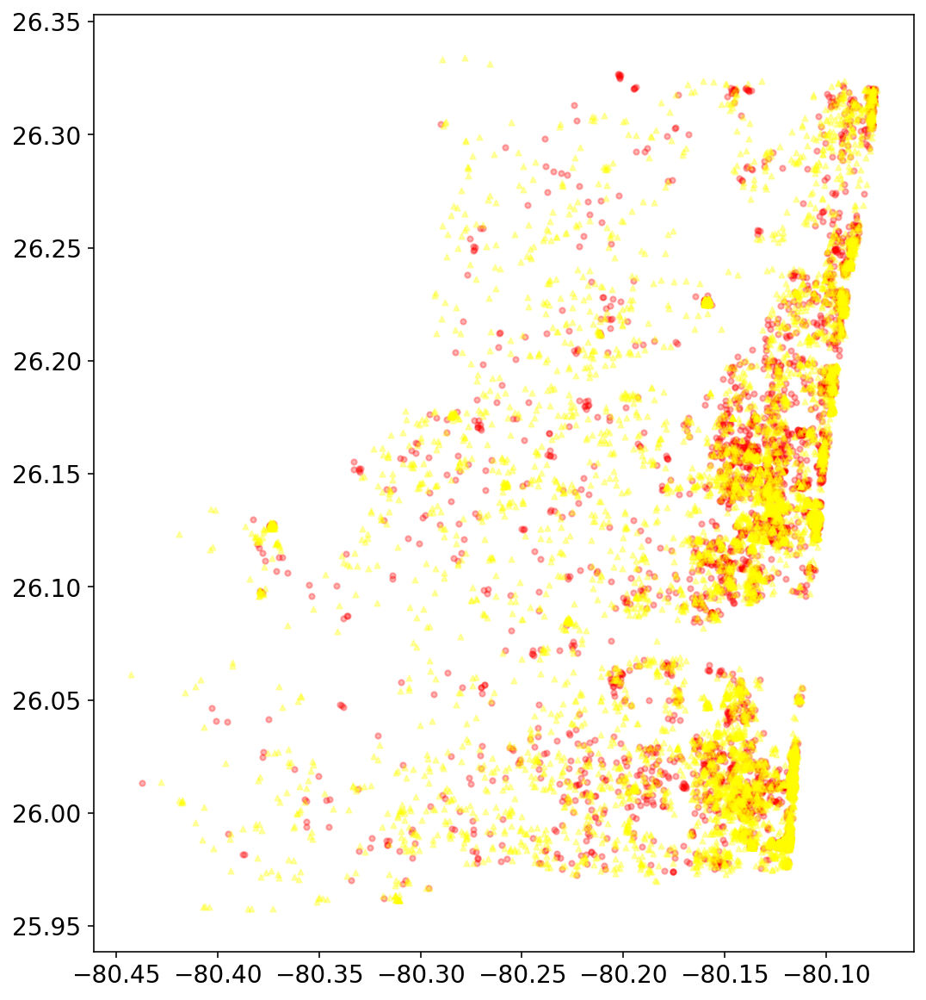

In [38]:
BBox = (df_fl_s.longitude.min(),   
        df_fl_s.longitude.min()+(df_fl_s.longitude.max() - df_fl_s.longitude.min())/0.69,      
        df_fl_s.latitude.min(), 
        df_fl_s.latitude.max())

# print(BBox)

fig, ax = plt.subplots(figsize = (20,10))
# fl_county_map.plot(ax = ax)
# ax.imshow(fl, zorder=0, 
#           extent = BBox, 
#           aspect= 'equal')
geo_df[geo_df['host_is_superhost'] != 'f'].plot(ax = ax, 
                                                alpha = 0.3,
                                                markersize = 10, 
                                                color = 'red',
                                                marker = 'o', 
                                                label = 'superhost')
geo_df[geo_df['host_is_superhost'] == 'f'].plot(ax = ax, 
                                                alpha = 0.3,
                                                markersize = 10, 
                                                color = 'yellow',
                                                marker = '^', 
                                                label = 'regular host')
# plt.legend(prop={'size': 15})

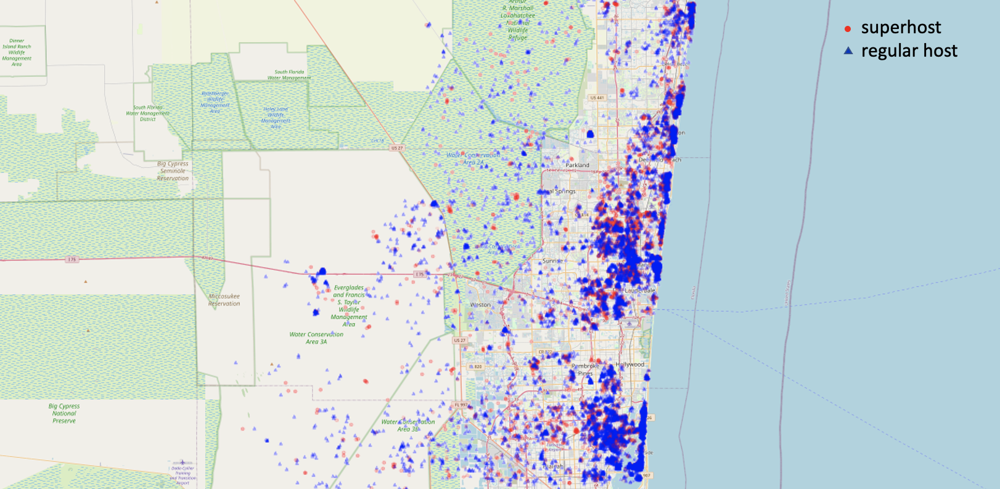

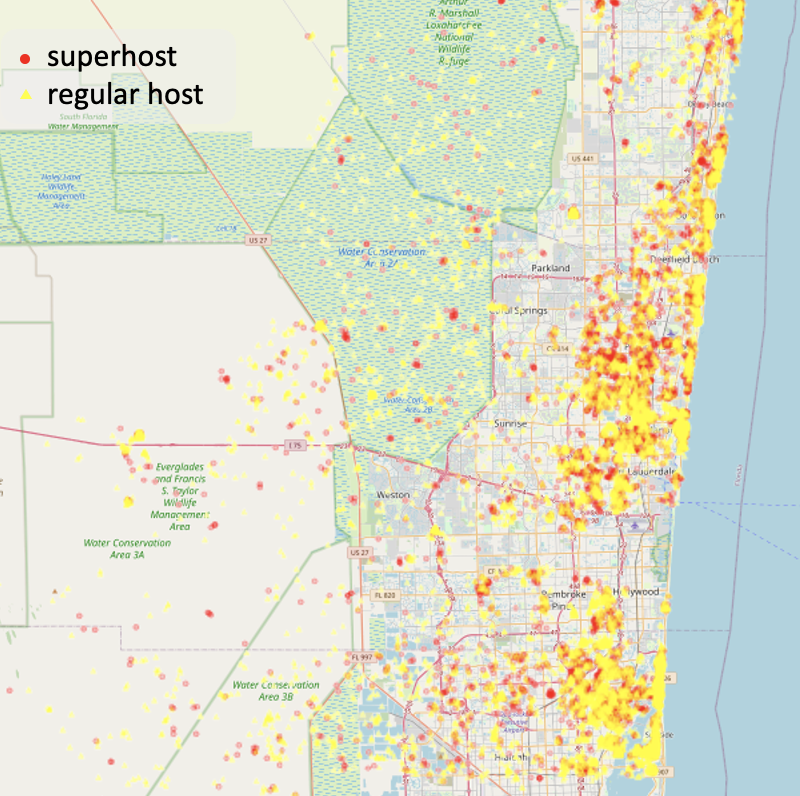

# LA Map

In [19]:
df_la = pd.read_csv("../00_source_data/listings_california.csv.gz")
df_la.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,109,https://www.airbnb.com/rooms/109,20211205213202,2021-12-06,Amazing bright elegant condo park front *UPGRA...,"*** Unit upgraded with new bamboo flooring, br...",NaN,https://a0.muscache.com/pictures/4321499/1da98...,521,https://www.airbnb.com/users/show/521,...,4.00,5.00,4.00,NaN,f,1,1,0,0,0.02
1,2708,https://www.airbnb.com/rooms/2708,20211205213202,2021-12-06,Runyon Canyon | Beau Furn Mirror Mini-Suite Fi...,"Run Runyon Canyon, Our Gym & Sauna Open <br />...","Walk and run to Runyon Canyon, it is open!<br ...",https://a0.muscache.com/pictures/miso/Hosting-...,3008,https://www.airbnb.com/users/show/3008,...,4.97,5.00,4.85,NaN,t,3,0,3,0,0.69
2,2732,https://www.airbnb.com/rooms/2732,20211205213202,2021-12-06,Zen Life at the Beach,An oasis of tranquility awaits you.<br /><br /...,"This is the best part of Santa Monica. Quiet, ...",https://a0.muscache.com/pictures/1082974/0f74c...,3041,https://www.airbnb.com/users/show/3041,...,4.70,4.90,4.40,228269,f,2,1,1,0,0.35
3,2864,https://www.airbnb.com/rooms/2864,20211205213202,2021-12-06,* Beautiful Master Suite/Jacuzzi Tub/*,Centrally located.... Furnished with King Size...,What makes the neighborhood unique is that the...,https://a0.muscache.com/pictures/23817858/de20...,3207,https://www.airbnb.com/users/show/3207,...,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN
4,3021,https://www.airbnb.com/rooms/3021,20211205213202,2021-12-07,Hollywood Hills Zen Modern style Apt/Guesthouse,A very Modern Hollywood Hills Zen style galler...,This is the famous Hollywood hills.. Historica...,https://a0.muscache.com/pictures/5147dcd2-efad...,3415,https://www.airbnb.com/users/show/3415,...,4.30,4.64,4.00,NaN,f,4,1,3,0,0.23


In [20]:
df_la.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [21]:
df_la_s = df_la[['host_is_superhost', 'latitude', 'longitude']]

In [22]:
df_la_s.head()

,host_is_superhost,latitude,longitude
0,f,33.98301,-118.38607
1,t,34.09625,-118.34605
2,t,34.00440,-118.48095
3,f,33.87490,-118.11515
4,f,34.11160,-118.38223


In [23]:
sum(df_la_s.host_is_superhost != 'f')

10035

In [24]:
geometry_la = [Point(xy) for xy in zip(df_la_s['longitude'], df_la_s['latitude'])]
geometry_la[:3]

In [25]:
geo_df_la = gpd.GeoDataFrame(df_la_s, 
                         crs = crs, 
                         geometry=geometry_la)
geo_df_la.head()

/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,host_is_superhost,latitude,longitude,geometry
0,f,33.98301,-118.38607,POINT (-118.38607 33.98301)
1,t,34.09625,-118.34605,POINT (-118.34605 34.09625)
2,t,34.00440,-118.48095,POINT (-118.48095 34.00440)
3,f,33.87490,-118.11515,POINT (-118.11515 33.87490)
4,f,34.11160,-118.38223,POINT (-118.38223 34.11160)


## Solution 1

Precise mapping using geodata for county boundary here: https://public.opendatasoft.com/explore/dataset/us-county-boundaries/information/?disjunctive.statefp&disjunctive.countyfp&disjunctive.name&disjunctive.namelsad&disjunctive.stusab&disjunctive.state_name

However, the bounary seems to include the sea line. 

Further, the result doesn't look nice for report

In [26]:
# la_county_map2 = gpd.read_file('./ca_58/us-county-boundaries/us-county-boundaries.shp')
la_county_map2 = gpd.read_file('./../../filesMapFLCA/ca_1//us-county-boundaries/us-county-boundaries.shp')

<AxesSubplot:>

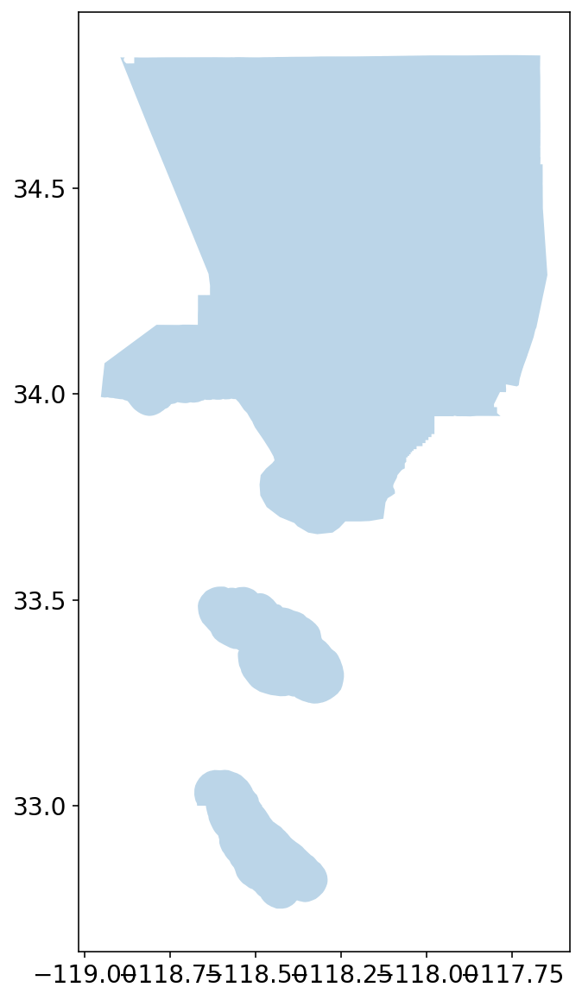

In [27]:
fig, ax = plt.subplots()
la_county_map2.plot(ax=ax, alpha = 0.3)

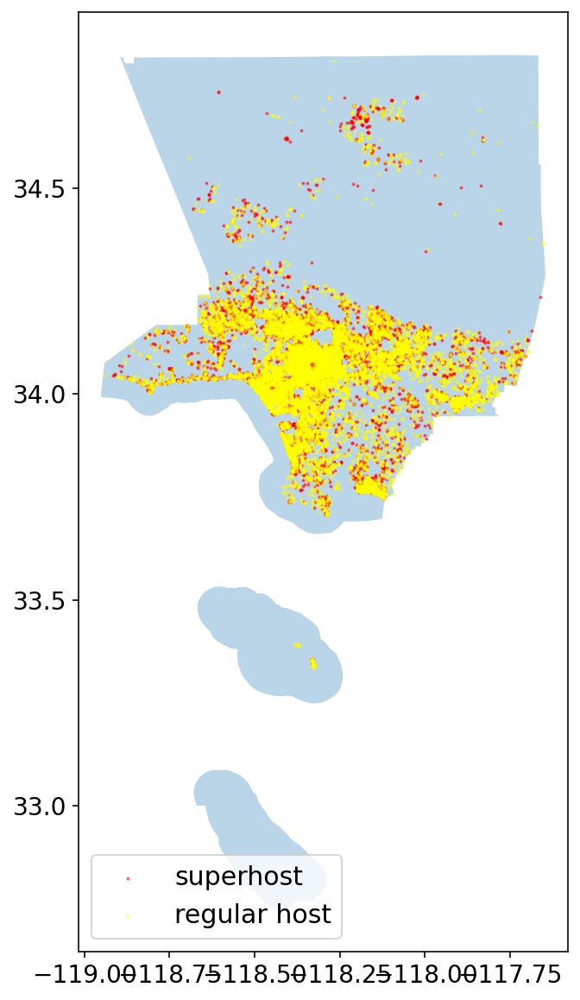

In [39]:

fig, ax = plt.subplots(figsize = (20,10))
# solution 1
# fl_county_map.plot(ax = ax)
# ax.imshow(la, zorder=0, 
#           extent = BBox, 
#           aspect= 'equal')

# solution 2
la_county_map2.plot(ax=ax, alpha = 0.3)

# solution 3
# gdf_la.plot(ax = ax, alpha = 0.3) 

geo_df_la[geo_df_la['host_is_superhost'] != 'f'].plot(ax = ax,
                                                      alpha = 0.5,
                                                markersize = 1, 
                                                color = 'red',
                                                marker = 'o', 
                                                label = 'superhost')
geo_df_la[geo_df_la['host_is_superhost'] == 'f'].plot(ax = ax, 
                                                      alpha = 0.5,
                                                markersize = 1, 
                                                color = 'yellow',
                                                marker = '^', 
                                                label = 'regular host')
plt.legend(prop={'size': 15})

## Solution 2

A lot tweaked method by adjusting both BBox and background picture.

Best looking for report and presentation. Inprecise location.

In [30]:
la = plt.imread("./../../filesMapFLCA/lamap.png")

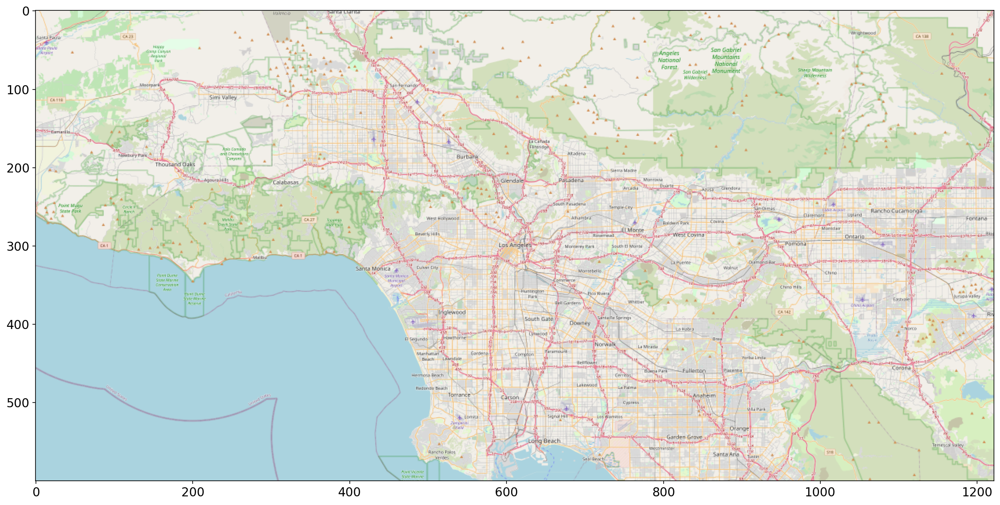

In [31]:
fig, ax = plt.subplots(figsize = (20, 10))
ax.imshow(la)

In [32]:
# df_county_la = pd.read_csv("./us-county-boundaries.csv")
# df_county_la.head()

In [33]:
# gdf_la = gpd.read_file('./us-county-boundaries.csv')
# gdf_la.crs = 'epsg:4326'

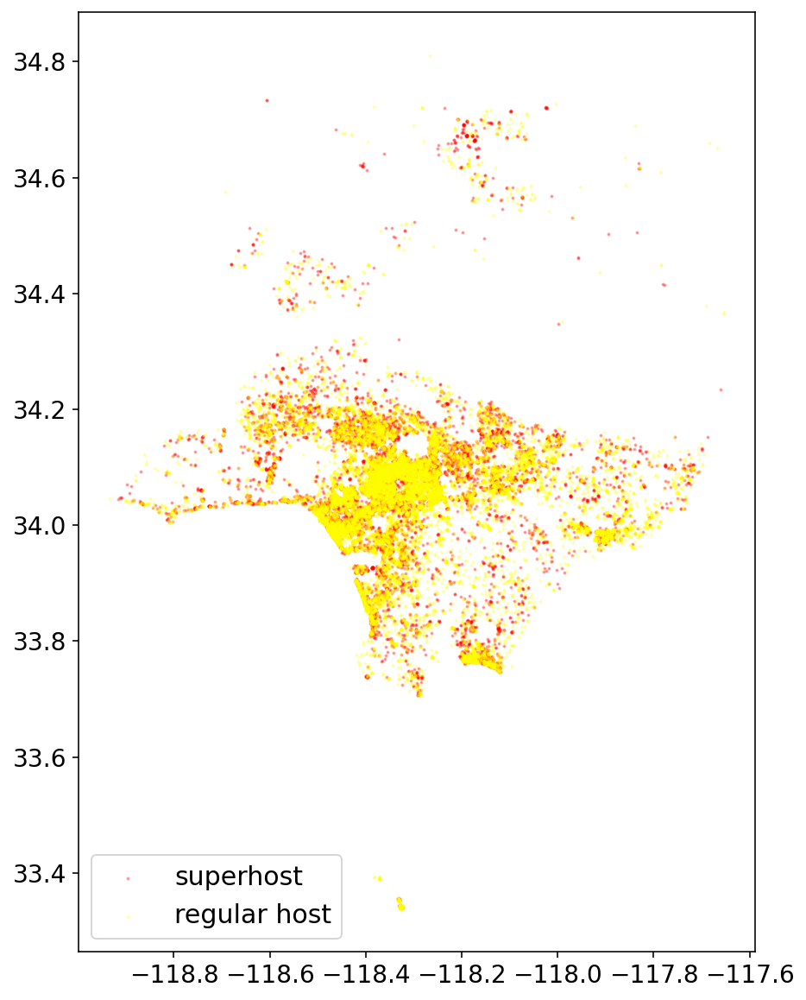

In [34]:
fig, ax = plt.subplots(figsize = (20,10))

geo_df_la[geo_df_la['host_is_superhost'] != 'f'].plot(ax = ax,
                                                      alpha = 0.3,
                                                      markersize = 1, 
                                                      color = 'red',
                                                      marker = 'o', 
                                                      label = 'superhost')
geo_df_la[geo_df_la['host_is_superhost'] == 'f'].plot(ax = ax, 
                                                      alpha = 0.3,
                                                      markersize = 1, 
                                                      color = 'yellow',
                                                      marker = '^', 
                                                      label = 'regular host')
plt.legend(prop={'size': 15})

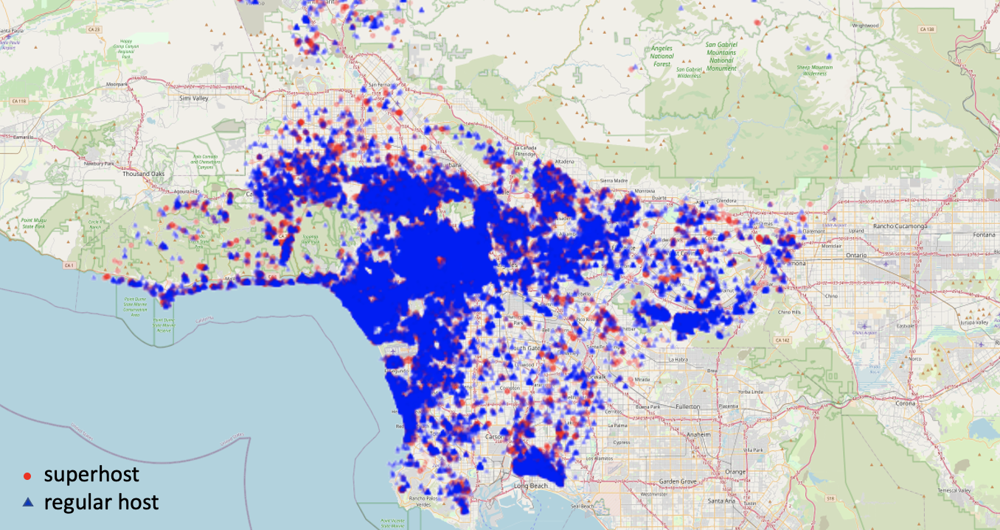

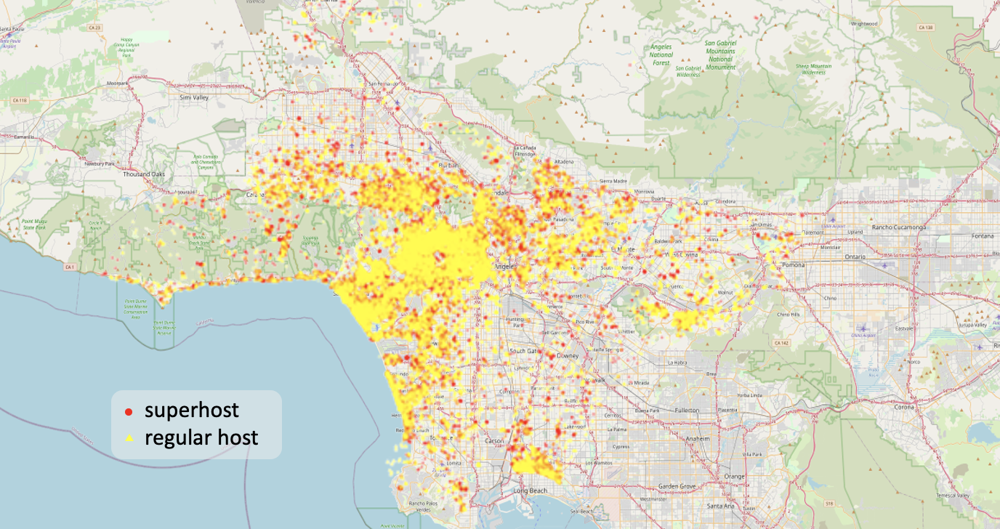